# 1. Data Preprocessing for Image Segmentation
## Image Processing & Dataset Preparation
 * Checks Image Dimensions – Ensures all images have the same size for consistency in model training.
 * Creates an Image DataFrame – Extracts and stores image IDs in a structured format using Pandas.

In [1]:
import numpy as np
import pandas as pd
import os
import cv2

IMAGE_PATH = '../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/'
MASK_PATH = '../input/semantic-drone-dataset/RGB_color_image_masks/RGB_color_image_masks'

max_images = 50  # Set this to the number of images you want to process

def check_image_dimensions(IMAGE_PATH, max_images=50):
    dimensions = []
    count = 0

    # Iterate through images with a limit
    for image_file in os.listdir(IMAGE_PATH):
        if image_file.endswith('.jpg'):
            image_path = os.path.join(IMAGE_PATH, image_file)
            image = cv2.imread(image_path)
            dimensions.append(image.shape)
            count += 1

            # Stop once the desired number of images is processed
            if count >= max_images:
                break

    # Print unique image dimensions
    unique_dimensions = set(dimensions)
    print(f"Unique image dimensions: {unique_dimensions}")

check_image_dimensions(IMAGE_PATH, max_images=max_images)


n_classes = 23

def create_df():
    name = []
    for dirname, _, filenames in os.walk(IMAGE_PATH):
        for filename in filenames:
            name.append(filename.split('.')[0])

    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df = create_df()
print('Total Images: ', len(df))

Unique image dimensions: {(4000, 6000, 3)}
Total Images:  400


## Loading Class Dictionary
* Reads a CSV file containing class labels and their corresponding color codes for semantic segmentation.

In [2]:
class_dict_path = '/kaggle/input/semantic-drone-dataset/class_dict_seg.csv'

class_dict_df = pd.read_csv(class_dict_path)
print(class_dict_df)

           name    r    g    b
0     unlabeled    0    0    0
1    paved-area  128   64  128
2          dirt  130   76    0
3         grass    0  102    0
4        gravel  112  103   87
5         water   28   42  168
6         rocks   48   41   30
7          pool    0   50   89
8    vegetation  107  142   35
9          roof   70   70   70
10         wall  102  102  156
11       window  254  228   12
12         door  254  148   12
13        fence  190  153  153
14   fence-pole  153  153  153
15       person  255   22   96
16          dog  102   51    0
17          car    9  143  150
18      bicycle  119   11   32
19         tree   51   51    0
20    bald-tree  190  250  190
21    ar-marker  112  150  146
22     obstacle    2  135  115
23  conflicting  255    0    0


# 2. Exploratory Data Analysis:

##  Class Occurrence Analysis in Semantic Masks with Resizing Functionality

*  This code processes semantic segmentation mask images, checks which classes (represented by specific RGB colors) are present in each mask, counts their occurrences across the dataset, and visualizes the results using a bar plot. It leverages GPU acceleration (if available) for faster processing and resizes the masks to optimize memory usage and computation speed.

Using device: cuda


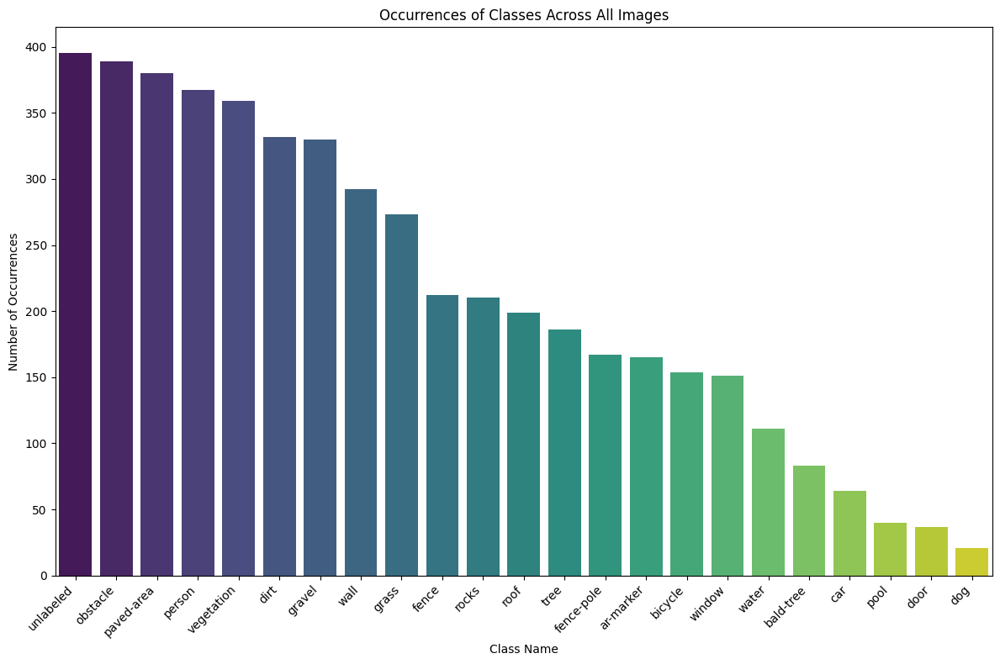

In [3]:
import numpy as np
import cv2
import os
import torch
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Paths to dataset
MASK_PATH = '/kaggle/input/semantic-drone-dataset/RGB_color_image_masks/RGB_color_image_masks'
CLASS_DICT_PATH = '/kaggle/input/semantic-drone-dataset/class_dict_seg.csv'

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Resize mask function to optimize processing
def resize_mask(mask, target_size=(1024, 1024)):
    """Resize the mask to the target size for faster computation."""
    return cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)

# Function to check class occurrence for all images using GPU if available
def check_class_occurrence(mask_folder, class_dict, resize=False):
    """Check the occurrence of classes in all images."""
    class_occurrence = defaultdict(list)

    # Extract RGB values for each class from the class dictionary
    class_colors = {
        row['name']: (row['r'], row['g'], row['b']) for _, row in class_dict.iterrows()
    }

    for mask_file in os.listdir(mask_folder):
        if mask_file.endswith('.png'):
            mask_path = os.path.join(mask_folder, mask_file)
            mask = cv2.imread(mask_path)

            # Resize the mask if the option is enabled
            if resize:
                mask = resize_mask(mask)

            # Convert mask to tensor and move to GPU if available
            mask_tensor = torch.tensor(mask, device=device)

            # Check for the presence of each class in the mask
            for class_name, (r, g, b) in class_colors.items():
                color_tensor = torch.tensor([b, g, r], device=device)
                class_mask = torch.all(mask_tensor == color_tensor, dim=-1)
                if torch.any(class_mask):
                    class_occurrence[mask_file].append(class_name)

    return class_occurrence

# Load the class dictionary
class_dict_df = pd.read_csv(CLASS_DICT_PATH)
class_dict_df.columns = class_dict_df.columns.str.strip()

# Call the function without limiting the number of images
class_occurrence = check_class_occurrence(MASK_PATH, class_dict_df, resize=True)

# Flatten the dictionary to count occurrences of each class
all_classes = [class_name for classes in class_occurrence.values() for class_name in classes]
class_counts = pd.Series(all_classes).value_counts()

# Plot the occurrences of each class across all processed images
plt.figure(figsize=(12, 8))
sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")
plt.title("Occurrences of Classes Across All Images")
plt.xlabel("Class Name")
plt.ylabel("Number of Occurrences")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


## Visualization of Class Occurrences in Semantic Masks

* This code loads a mask image, visualizes the different classes represented by specific RGB colors, and overlays them onto a blank image. It then creates a plot showing the image with the class colors and a legend on the side to identify each class by its color. If any class is not found in the mask, it will print a warning message. This visualization allows you to easily interpret which classes are present in a given mask image.

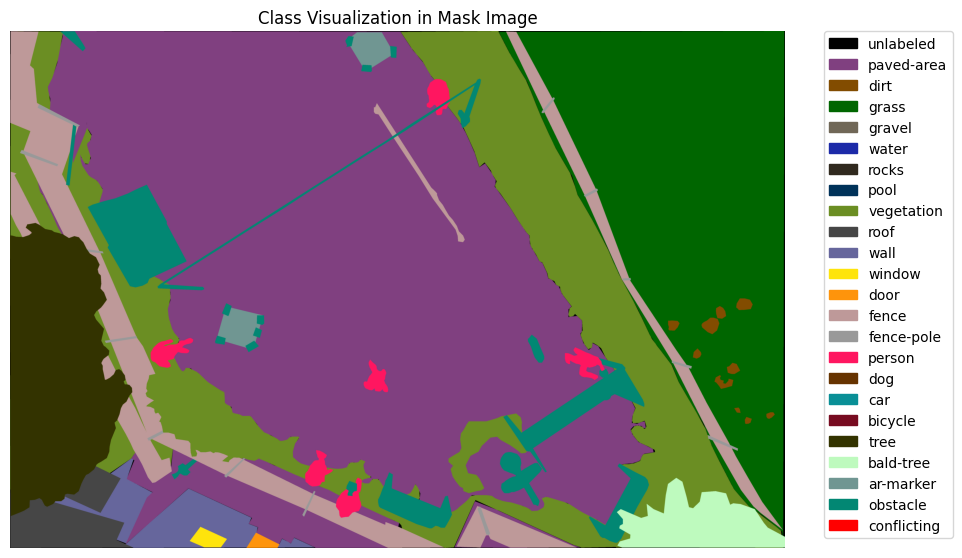

In [4]:
import matplotlib.patches as mpatches

# Resize mask function to optimize processing
def resize_mask(mask, target_size=(1024, 1024)):
    """Resize the mask to the target size for faster computation."""
    return cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)

# Function to visualize classes on an image
def visualize_class_occurrence(mask_path, class_dict):
    """Overlay each class in a mask with its corresponding color."""
    mask = cv2.imread(mask_path)
    if mask is None:
        raise FileNotFoundError(f"Mask file not found: {mask_path}")

    # Convert the mask from BGR to RGB
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

    # Create a blank image for visualization
    vis_image = np.zeros_like(mask)

    # Extract RGB values for each class from the class dictionary
    class_colors = {
        row['name']: (row['r'], row['g'], row['b']) for _, row in class_dict.iterrows()
    }

    # Apply each class color to the blank image where that class is present in the mask
    for class_name, (r, g, b) in class_colors.items():
        # Check if the color is found in the mask
        class_mask = np.all(mask == [r, g, b], axis=-1)
        if np.any(class_mask):
            vis_image[class_mask] = [r, g, b]
        else:
            print(f"Warning: Color {r, g, b} for class '{class_name}' not found in the mask.")

    return vis_image, class_colors

# Load the class dictionary
class_dict_df = pd.read_csv(CLASS_DICT_PATH)
class_dict_df.columns = class_dict_df.columns.str.strip()

# Define a sample mask file for visualization
sample_mask_file = os.path.join(MASK_PATH, '001.png')  # Update this filename as needed

# Generate visualization
vis_image, class_colors = visualize_class_occurrence(sample_mask_file, class_dict_df)

# Plot the image with a legend for each class color
plt.figure(figsize=(10, 10))
plt.imshow(vis_image)
plt.axis('off')

# Create a color legend
patches = [mpatches.Patch(color=np.array(color)/255.0, label=class_name)
           for class_name, color in class_colors.items()]
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.)
plt.title("Class Visualization in Mask Image")
plt.show()


## Visualizing Image and Segmentation Mask Pairs with Class Color Overlay
* This code is designed to display pairs of images and their corresponding segmentation masks. For each image ID, it loads the image and its mask, processes the mask to apply class colors, and then displays them side by side in a plot. It makes it easy to visually compare the original image with the mask to assess the quality of the segmentation. 


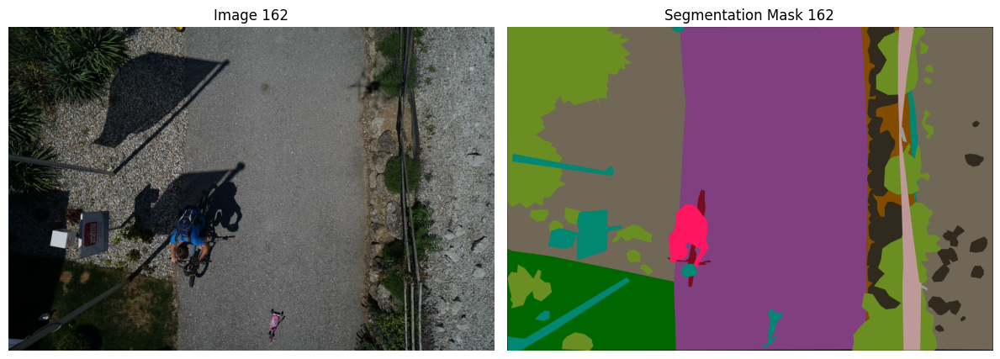

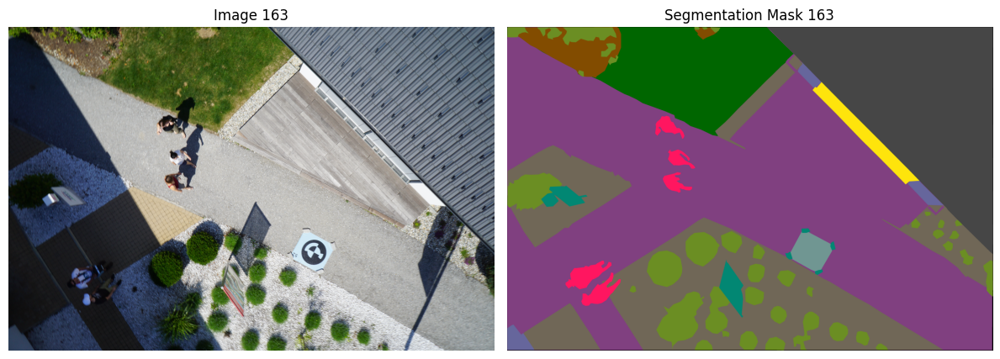

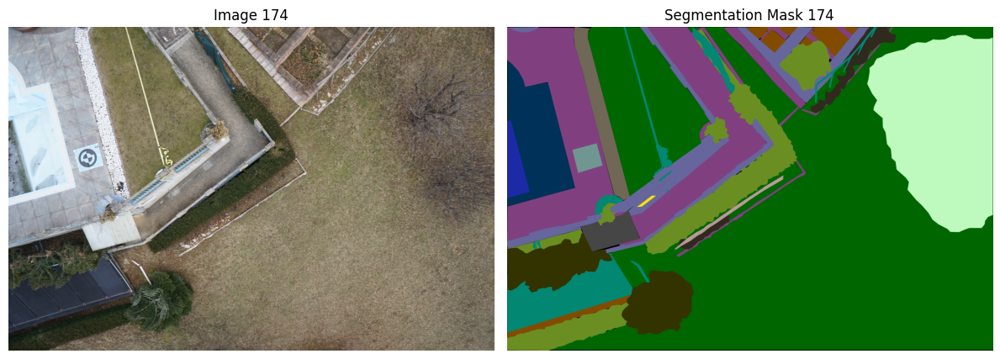

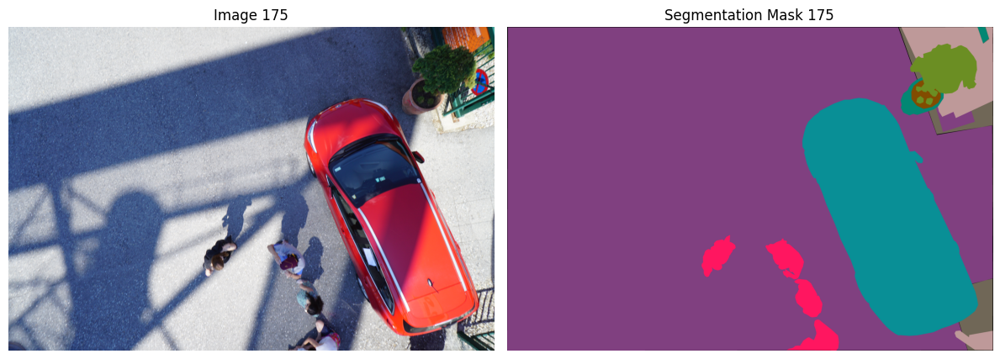

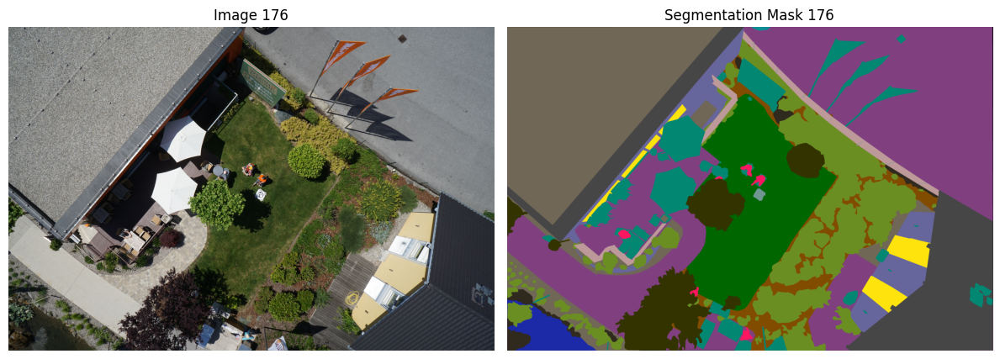

In [5]:
def visualize_image_and_mask(image_id, class_dict):
    # Construct file paths with appropriate extensions
    image_path = os.path.join(IMAGE_PATH, f"{image_id}.jpg")
    mask_path = os.path.join(MASK_PATH, f"{image_id}.png")

    # Load the image and mask
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path)

    # Check if the image and mask were loaded correctly
    if image is None:
        print(f"Error loading image: {image_path}")
        return
    if mask is None:
        print(f"Error loading mask: {mask_path}")
        return

    # Convert the mask to the same logic as visualize_class_occurrence
    vis_image, _ = visualize_class_occurrence(mask_path, class_dict)

    # Plot the image and mask side by side
    plt.figure(figsize=(12, 6))

    # Display the original image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
    plt.title(f'Image {image_id}')
    plt.axis('off')

    # Display the processed mask with class colors
    plt.subplot(1, 2, 2)
    plt.imshow(vis_image)
    plt.title(f'Segmentation Mask {image_id}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
image_ids = [162, 163, 174, 175, 176]
for image_id in image_ids:
    visualize_image_and_mask(image_id, class_dict_df)


# 3. Data Cleaning and Preparation

## Parallel Image Quality Check for Lighting, Blurriness, and Dimensions in a Dataset
*  This code is designed to perform an automated quality check on a dataset of images. It detects potential issues related to lighting, blurriness, and image dimensions. The checks are done in parallel to optimize processing time, which is especially beneficial when dealing with large datasets.

In [6]:
import numpy as np
import cv2
import os
from concurrent.futures import ThreadPoolExecutor
import matplotlib.pyplot as plt

# Resize mask function to optimize processing
def resize_mask(mask, target_size=(1024, 1024)):
    """Resize the mask to the target size for faster computation."""
    return cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)

# Function to get image IDs dynamically
def get_image_ids(image_folder, max_images=None):
    """Fetch image IDs from the folder."""
    image_ids = []
    for filename in os.listdir(image_folder):
        if filename.endswith(".jpg"):
            image_id = filename.split(".")[0]  # Extract '001', '011', etc.
            image_ids.append(image_id)
        if max_images and len(image_ids) >= max_images:
            break
    return image_ids

# Function to check lighting variation
def check_lighting_variation(image_path):
    """Calculate the brightness of the image."""
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error loading image: {image_path}")
        return None
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    brightness = np.mean(gray_image)
    return brightness

# Function to check blurriness
def check_image_blurriness(image_path):
    """Calculate the variance of Laplacian to check blurriness."""
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error loading image: {image_path}")
        return None
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    laplacian_var = cv2.Laplacian(gray_image, cv2.CV_64F).var()
    return laplacian_var

# Function to check image dimensions
def check_image_dimensions(image_path, expected_dimensions=(4000, 6000)):
    """Check the dimensions of the image."""
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error loading image: {image_path}")
        return False
    height, width = image.shape[:2]
    return (height, width) == expected_dimensions

# Function to detect outliers in parallel
def detect_outliers(image_ids, image_folder, lighting_threshold=100, blurriness_threshold=100, expected_dimensions=(4000, 6000)):
    outliers = {
        'lighting_variations': [],
        'blurry_images': [],
        'different_aspect_ratios': [],
    }

    def process_image(image_id):
        image_path = os.path.join(image_folder, f"{image_id}.jpg")

        # Check lighting variations
        brightness = check_lighting_variation(image_path)
        if brightness is not None and brightness < lighting_threshold:
            outliers['lighting_variations'].append(image_id)

        # Check blurriness
        blur_value = check_image_blurriness(image_path)
        if blur_value is not None and blur_value < blurriness_threshold:
            outliers['blurry_images'].append(image_id)

        # Check dimensions
        if not check_image_dimensions(image_path, expected_dimensions):
            outliers['different_aspect_ratios'].append(image_id)

    # Use ThreadPoolExecutor for parallel processing
    with ThreadPoolExecutor() as executor:
        executor.map(process_image, image_ids)

    return outliers

# Paths
image_folder = '../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/'

# Fetch image IDs
image_ids = get_image_ids(image_folder)

# Detect outliers
detected_outliers = detect_outliers(image_ids, image_folder)

# Print detected outliers with counts
for outlier_type, ids in detected_outliers.items():
    print(f"{outlier_type}: {ids}")
    print(f"Total {outlier_type}: {len(ids)}")


lighting_variations: ['272', '185', '153', '237', '513', '265', '118', '361', '443', '295', '106', '349', '006', '500', '156', '011', '120', '290', '512', '480', '408', '515', '101', '051', '382', '311', '397', '047', '186', '403', '390', '381', '455', '068', '001', '419', '015', '246', '135', '458', '103', '543', '296', '126', '545', '485', '587', '071', '281', '207', '598', '588', '206', '257', '351', '041', '229', '222', '330', '119', '305', '262', '052', '055', '386', '162', '428', '060', '232', '013', '306', '593', '133', '016', '044', '454', '040']
Total lighting_variations: 77
blurry_images: ['014', '182', '272', '202', '118', '591', '443', '163', '349', '463', '251', '011', '120', '512', '480', '515', '372', '193', '056', '382', '047', '435', '530', '001', '075', '042', '419', '015', '145', '356', '135', '246', '292', '458', '005', '121', '173', '063', '174', '261', '391', '451', '004', '346', '310', '126', '572', '545', '194', '567', '155', '485', '071', '138', '209', '598', '

## Visualizing Detected Outliers in an Image Dataset
* This code extends the previous image quality check by adding a visualization step. It dynamically displays a subset of images identified as outliers due to lighting variations, blurriness, or incorrect dimensions

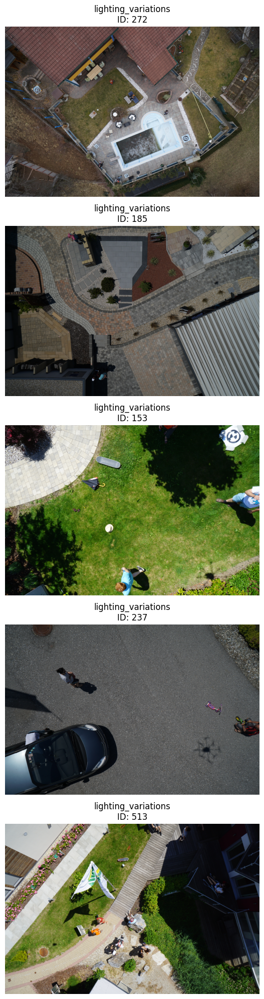

In [7]:
import math

# Function to load an image given its ID
def load_image(image_id):
    image_path = os.path.join(image_folder, f"{image_id}.jpg")
    return cv2.imread(image_path)

# Function to visualize detected outliers dynamically
def visualize_outliers(outliers, max_images=5):
    # Track the number of images displayed
    images_displayed = 0

    plt.figure(figsize=(15, max_images * 4))

    # Iterate through each type of outlier and its corresponding image IDs
    for outlier_type, ids in outliers.items():
        for image_id in ids:
            if images_displayed >= max_images:
                break

            image = load_image(image_id)
            if image is not None:
                # Convert BGR to RGB
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Display the image
                plt.subplot(max_images, 1, images_displayed + 1)
                plt.imshow(image_rgb)
                plt.title(f"{outlier_type}\nID: {image_id}")
                plt.axis('off')

                images_displayed += 1
            else:
                print(f"Image with ID {image_id} not found.")

        if images_displayed >= max_images:
            break

    plt.tight_layout()
    plt.show()

# Detect outliers using your previously defined function
image_ids = get_image_ids(image_folder)
detected_outliers = detect_outliers(image_ids, image_folder)

# Visualize up to 5 detected outliers
visualize_outliers(detected_outliers, max_images=5)


# 4. Dataset Preparation and Visualization for Semantic Segmentation for Model Training
* This script installs the necessary Python libraries for training an image segmentation model using PyTorch

In [8]:
!pip install kaggle -q
!pip install segmentation_models_pytorch -q
!pip install scikit-learn -q

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 6.9 MB/s eta 0:00:00


## Importing Essential Libraries for Image Segmentation
* This script imports all necessary libraries for deep learning-based image segmentation

In [9]:
print("Importing libraries...")
import os
import random
import shutil
import torch
import gc
import ssl

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp

import torch.nn as nn
import torch.optim as optim

from PIL import Image
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF
from concurrent.futures import ThreadPoolExecutor
from sklearn.model_selection import train_test_split
print("Finished Importing")

Importing libraries...
Finished Importing


## Dataset Paths and Parameters Configuration for Semantic Segmentation
* This script configures random seeds, device selection (GPU/CPU), and SSL settings for training a semantic segmentation model. It also defines paths for high-resolution and resized images, segmentation masks, and class labels, ensuring a smooth data preprocessing pipeline

In [10]:
# PARAMETERS DEFINITION

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

torch.set_printoptions(edgeitems=10)                                    # Set how many elements do the print(tensor) show
ssl._create_default_https_context = ssl._create_unverified_context      # Set ssl context as unverified to avoid SSL errors
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")   # Set compute device to GPU if available, else to CPU

resize_images = True                                                     # Set to True if you want to resize the images to the specified dimensions
download_dataset_from_kaggle = False                                     # Set to True if you want to download the dataset from Kaggle API required
resize_dimensions = (512, 512)                                           # Set the dimensions to resize the images to



# PATHS DEFINITION

# Original dataset paths of (6000x4000 images)
original_images_path = "/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images"
original_segmentated_rgb_images_path = "/kaggle/input/semantic-drone-dataset/RGB_color_image_masks/RGB_color_image_masks"
original_segmentated_images_path = "/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic"

# Reduced size dataset paths (512x512 images)
reduced_images_path = "/kaggle/working/original_images"
reduced_segmentated_rgb_images_path = "/kaggle/working/segmentated_rgb_images"
reduced_segmentated_images_path = "/kaggle/working/segmentated_images"

# CSV file path of images pairs
class_dict_path = "/kaggle/input/semantic-drone-dataset/class_dict_seg.csv"

##  Image Resizing for Dataset Preparation
* This code resizes images in a folder to specified dimensions using parallel processing. It handles original, RGB segmented, and grayscale segmented images, saving the resized versions and creating a zip archive.

In [11]:
# Function to resize a single image
def resize_image(input_output_path_tuple, new_width, new_height, interpolation=Image.LANCZOS):
    input_path, output_path = input_output_path_tuple
    # If the file is an image
    if os.path.isfile(input_path) and input_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Open and resize the image
        with Image.open(input_path) as img:
            resized_img = img.resize((new_width, new_height), interpolation)
            resized_img.save(output_path)
    else:
        print(f"Skipped {input_path} as it is not an image.")

# Function to resize all images in a folder
def resize_images_in_folder(input_folder, output_folder, new_width, new_height, interpolation=Image.NEAREST):
    # Create output folder
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # List of input and output paths
    input_output_paths = [(os.path.join(input_folder, filename), os.path.join(output_folder, filename)) for filename in os.listdir(input_folder)]

    # Use ThreadPoolExecutor to parallelize the resizing process
    with ThreadPoolExecutor() as executor:
        list(tqdm(executor.map(lambda p: resize_image(p, new_width, new_height, interpolation), input_output_paths), total=len(input_output_paths)))

# Resize images if needed
if resize_images:
    print("Resizing original images...")
    resize_images_in_folder(original_images_path, "kaggle/working/original_images", resize_dimensions[0], resize_dimensions[1], Image.NEAREST)
    print("Resizing rgb segmented images...")
    resize_images_in_folder(original_segmentated_rgb_images_path, "kaggle/working/segmentated_rgb_images", resize_dimensions[0], resize_dimensions[1], Image.NEAREST)
    print("Resizing grayscale segmented images...")
    resize_images_in_folder(original_segmentated_images_path, "kaggle/working/segmentated_images", resize_dimensions[0], resize_dimensions[1], Image.NEAREST)

    # Create a zip archive of the resized images
    shutil.make_archive("resized_images", 'zip', "kaggle/working/")

  0%|          | 0/400 [00:00<?, ?it/s]

Resizing original images...
Resizing rgb segmented images...


  0%|          | 0/400 [00:00<?, ?it/s]

Resizing grayscale segmented images...


  0%|          | 0/400 [00:00<?, ?it/s]

##  Creating a Dataset and Loading Class Dictionary for Image Segmentation
* This script creates a dataset by pairing original images with their corresponding segmentation labels (both grayscale and RGB). The dataset is represented as a DataFrame, and a class dictionary is loaded to map label IDs to class names. The code uses paths for original images, segmented images, and class labels stored in CSV format

In [12]:
import pandas as pd
import os

# Function to create a dataset DataFrame and load class dictionary
def create_dataset_and_load_class_dict(original_images_path, segmented_images_path, segmented_rgb_images_path, class_dict_path):
    # Initialize DataFrame with columns
    df = pd.DataFrame(columns=["image_path", "label_path", "rgb_label_path"])

    row_list = []
    # Walk through the original images folder
    for root, dirs, files in os.walk(original_images_path):
        for file in files:
            if file.endswith((".jpg", ".png")):
                # Define paths for image, label, and RGB label
                image_path = os.path.join(original_images_path, file)
                label_file = file.replace(".jpg", ".png").replace(".jpeg", ".png")
                label_path = os.path.join(segmented_images_path, label_file)
                rgb_label_path = os.path.join(segmented_rgb_images_path, label_file)

                # Append row information to the list
                row_list.append({"image_path": image_path, "label_path": label_path, "rgb_label_path": rgb_label_path})

    # Create DataFrame from the list
    df = pd.DataFrame(row_list)

    # Load classes dictionary as DataFrame
    df_classes = pd.read_csv(class_dict_path)

    return df, df_classes

class_dict_path = '/kaggle/input/semantic-drone-dataset/class_dict_seg.csv'

# Paths for reduced datasets
reduced_images_path = '/kaggle/working/kaggle/working/original_images'
reduced_segmented_rgb_images_path = '/kaggle/working/kaggle/working/segmentated_rgb_images'
reduced_segmented_images_path = '/kaggle/working/kaggle/working/segmentated_images'  # New path for grayscale label images

# Create dataframe of images paths and load class dictionary
df, df_classes = create_dataset_and_load_class_dict(
    reduced_images_path,
    reduced_segmented_images_path,
    reduced_segmented_rgb_images_path,
    class_dict_path
)

# Display the first few rows of the dataset DataFrame
print("Dataset DataFrame:")
print(df.head())

# Display class dictionary
print("\nClasses Dictionary:")
print(df_classes.head())


Dataset DataFrame:
                                          image_path  \
0  /kaggle/working/kaggle/working/original_images...   
1  /kaggle/working/kaggle/working/original_images...   
2  /kaggle/working/kaggle/working/original_images...   
3  /kaggle/working/kaggle/working/original_images...   
4  /kaggle/working/kaggle/working/original_images...   

                                          label_path  \
0  /kaggle/working/kaggle/working/segmentated_ima...   
1  /kaggle/working/kaggle/working/segmentated_ima...   
2  /kaggle/working/kaggle/working/segmentated_ima...   
3  /kaggle/working/kaggle/working/segmentated_ima...   
4  /kaggle/working/kaggle/working/segmentated_ima...   

                                      rgb_label_path  
0  /kaggle/working/kaggle/working/segmentated_rgb...  
1  /kaggle/working/kaggle/working/segmentated_rgb...  
2  /kaggle/working/kaggle/working/segmentated_rgb...  
3  /kaggle/working/kaggle/working/segmentated_rgb...  
4  /kaggle/working/kaggle/workin

##  Displaying Sample Images and Labels from the Original Dataset
* This code displays sample images and their segmentation labels (both RGB and grayscale) from a dataset in a grid format. It uses a function display_samples() to visualize a set number of samples from any specified column in the DataFrame, showing images with a colormap and labels with specific value ranges.

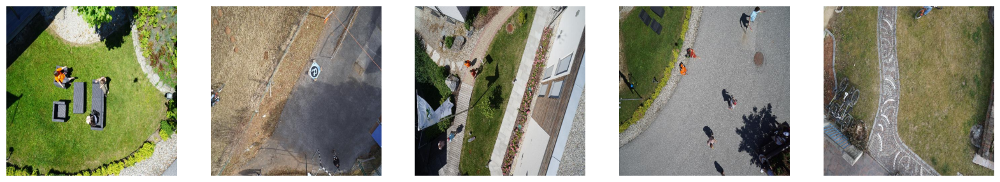

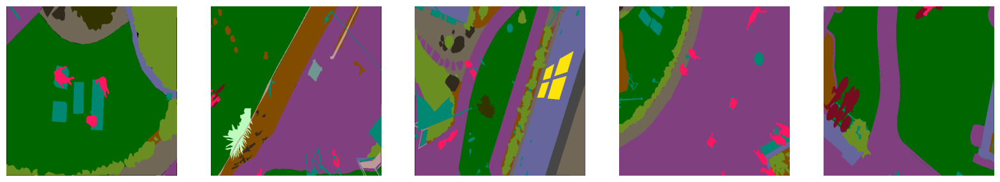

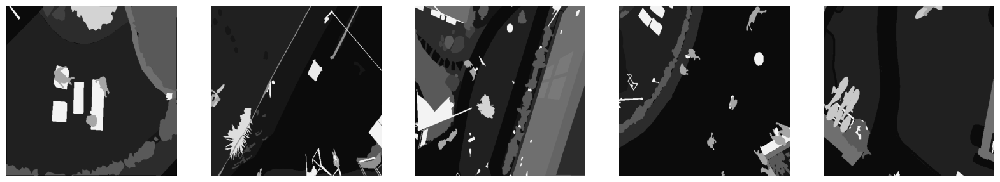

In [13]:
# Display some sample images and labels directly from the original dataset
def display_samples(dataframe, column, num_samples=5, title="Samples"):
    list_len = []
    plt.figure(figsize=(20, 10))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        img = Image.open(dataframe[column][i])
        #print(np.array(img))
        list_len.append(len(np.unique(img)))
        plt.imshow(img, cmap="gray",  vmin=0, vmax=23)
        plt.axis('off')
    #plt.title(title)
    #print(max(list_len))
    plt.show()

# Display sample images
display_samples(df, 'image_path', title="Sample Images")
# Display sample RGB labels
display_samples(df, 'rgb_label_path', title="Sample RGB Labels")
# Display sample labels
display_samples(df, 'label_path', title="Sample Labels")

##  Custom Dataset Class for Drone Image Segmentation
* This code defines a DroneDataset class to handle loading and processing of images and labels for drone semantic segmentation tasks. It supports applying transformations and normalizing the label values for segmentation.

In [14]:

# Create Dataset class
class DroneDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_path = self.df.iloc[idx, 0]
        label_path = self.df.iloc[idx, 1]

        image = Image.open(image_path)
        label = Image.open(label_path)

        if self.transform:
            image, label = self.transform(image, label)

        label = (1 + (label - label.min()) * (23 - 1) / (label.max() - label.min())).long()

        return image, label

## Data Augmentation and Preprocessing for Image Segmentation
* This code defines a CombinedTransform class that applies a series of data augmentation techniques (such as horizontal and vertical flips, rotations, and brightness/contrast adjustments) to images and their corresponding masks. It also handles resizing, normalization, and tensor conversion for preprocessing

In [15]:
# Data augmentation class
class CombinedTransform:
    def __init__(self, augment=True, mean=None, std=None):
        self.augment = augment
        self.mean = mean
        self.std = std

    def __call__(self, image, mask):
        if self.augment:
            if random.random() > 0.5:
                image = TF.hflip(image)
                mask = TF.hflip(mask)
            if random.random() > 0.5:
                image = TF.vflip(image)
                mask = TF.vflip(mask)
            if random.random() > 0.5:
                angle = random.uniform(-30, 30)
                image = TF.rotate(image, angle, interpolation=TF.InterpolationMode.NEAREST)
                mask = TF.rotate(mask, angle, interpolation=TF.InterpolationMode.NEAREST)
            if random.random() > 0.5:
                image = TF.adjust_brightness(image, brightness_factor=random.uniform(0.7, 1.3))
            if random.random() > 0.5:
                image = TF.adjust_contrast(image, contrast_factor=random.uniform(0.7, 1.3))


        if not self.augment:
            image = TF.resize(image, (512, 512), interpolation=TF.InterpolationMode.NEAREST)
            mask = TF.resize(mask, (512, 512), interpolation=TF.InterpolationMode.NEAREST)

            image = TF.to_tensor(image).float()
            mask = TF.to_tensor(mask).float()

            if self.mean is not None and self.std is not None:
                image = TF.normalize(image, mean=self.mean, std=self.std)

            return image, mask

        image = TF.resize(image, (512, 512), interpolation=TF.InterpolationMode.NEAREST)
        mask = TF.resize(mask, (512, 512), interpolation=TF.InterpolationMode.NEAREST)

        image = TF.to_tensor(image).float()
        mask = TF.to_tensor(mask).float()

        if self.mean is not None and self.std is not None:
            image = TF.normalize(image, mean=self.mean, std=self.std)

        return image, mask

##  Computing Mean and Standard Deviation for Dataset Normalization
* This code computes the mean and standard deviation of images in a given dataset for later use in normalizing the images during training. It iterates over a dataset, processes the images without any augmentation, and computes the mean and standard deviation for each color channel (RGB) using the specified batch size.

In [16]:
# Compute mean and standard deviation on original dataset
def compute_mean_std(train_df, dataset_class, transform_class, batch_size=16):
    # Use the transformation without augmentation and normalization
    original_transform = transform_class(augment=False, mean=None, std=None)
    original_dataset = dataset_class(train_df, transform=original_transform)
    original_dataloader = DataLoader(original_dataset, batch_size=batch_size, shuffle=False)

    mean = torch.zeros(3)
    std = torch.zeros(3)
    n_samples = 0

    for images, _ in original_dataloader:
        images = images.float()  # Ensure the images are in float type
        batch_samples = images.size(0)  # batch size (the last batch can have smaller size)
        images = images.view(batch_samples, images.size(1), -1)
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        n_samples += batch_samples
        break

    mean /= n_samples
    std /= n_samples

    return mean, std

##  Dataset Splitting, Transformation, and DataLoader Creation for Image Segmentation
* This code splits a dataset of images and segmentation labels into training, validation, and test sets. It then computes the mean and standard deviation of the training set for normalization, defines the transformation with augmentation and normalization, and creates the corresponding datasets and dataloaders for training, validation, and testing.

In [17]:
# Split the dataset dataframe into train, validation, and test sets
train_df, test_df = train_test_split(df, test_size=0.1)
train_df, val_df = train_test_split(train_df, test_size=0.1)
print("Train size:", len(train_df))
print("Validation size:", len(val_df))
print("Test size:", len(test_df))

# Compute mean and std
mean, std = compute_mean_std(train_df, DroneDataset, CombinedTransform)
print(f'Mean: {mean}, Std: {std}')

#Define the transformation with augmentation and normalization
train_transform = CombinedTransform(augment=True, mean=mean, std=std)
val_test_transform = CombinedTransform(augment=False, mean=mean, std=std)

# Create datasets
train_dataset = DroneDataset(train_df, transform=train_transform)
val_dataset = DroneDataset(val_df, transform=val_test_transform)
test_dataset = DroneDataset(test_df, transform=val_test_transform)

# Create dataloaders
batch_size = 4
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

Train size: 324
Validation size: 36
Test size: 40
Mean: tensor([0.4557, 0.4698, 0.4051]), Std: tensor([0.2380, 0.2302, 0.2457])


In [18]:
def denormalize_image(image, mean, std):
    # Ensure mean and std are numpy arrays
    mean = np.array(mean)
    std = np.array(std)

    # Denormalize the image
    image = image * std + mean

    # Clip the image to the valid range [0, 255] and normalize to [0, 1] for display
    image = np.clip(image, 0, 1)

    return image

# 5.  Simple FCN Model Training
* This code defines a Simple Fully Convolutional Network (FCN) for image segmentation with two parts: feature extraction using convolutional layers and max-pooling, and a classifier that generates a segmentation map with upsampling.

In [19]:
class SimpleFCN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleFCN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            #nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            #nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.classifier = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            #nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, num_classes, kernel_size=1),
            #nn.BatchNorm2d(num_classes),
            nn.Upsample(scale_factor=4, mode='bilinear', align_corners=True)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

##  Trainer Class for Training and Evaluating Semantic Segmentation Model
* The Trainer class is designed to train, validate, and test a semantic segmentation model. It supports early stopping, monitoring of training and validation losses, pixel-wise accuracy, mean IoU, and per-class IoU. The class also includes a method for plotting metrics like loss and accuracy during the training process

In [20]:
class Trainer:
    def __init__(self, model, train_dataloader, val_dataloader, test_dataloader, lr, patience=20, num_classes=24):
        # Dataloaders
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader
        self.test_dataloader = test_dataloader

        # Device, model, optimizer, criterion
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = model.to(self.device)
        self.optimizer = optim.AdamW(self.model.parameters(), lr=lr)
        self.criterion = smp.losses.JaccardLoss(mode='multiclass')
        #self.criterion = nn.CrossEntropyLoss()

        # Early stopping
        self.patience = patience
        self.best_val_loss = float('inf')
        self.epochs_no_improve = 0
        self.num_classes = num_classes
        self.best_model_state = None

        # Store metrics for plotting
        self.epoch = 0
        self.train_losses = []
        self.val_losses = []
        self.pixel_accuracies = []
        self.mean_iou_scores = []
        self.class_iou_scores = []

        self.lr = lr

    def train(self, epochs):
        gc.collect()
        torch.cuda.empty_cache()

        for epoch in range(epochs):
            self.model.train()

            self.epoch += 1
            running_loss = 0

            for i, (images, labels) in tqdm(enumerate(self.train_dataloader), total=len(self.train_dataloader)):
                images = images.to(self.device)
                labels = labels.to(self.device).squeeze(1).long()

                self.optimizer.zero_grad()

                outputs = self.model(images)

                loss = self.criterion(outputs, labels)
                loss.backward()

                self.optimizer.step()

                running_loss += loss.item()

            # Append train loss
            self.train_losses.append(running_loss / len(self.train_dataloader))

            # Calculate validation loss and metrics
            val_loss, val_pixel_acc, val_mean_iou, class_iou = self.evaluate(self.val_dataloader)
            self.val_losses.append(val_loss)
            self.pixel_accuracies.append(val_pixel_acc)
            self.mean_iou_scores.append(val_mean_iou)
            self.class_iou_scores.append(class_iou)

            # Print metrics
            print(f"Epoch {self.epoch} - Train Loss: {self.train_losses[-1]}, Validation Loss: {val_loss}, "
                  f"Pixel-wise Accuracy: {val_pixel_acc}, Mean IoU: {val_mean_iou}")

            #if epoch % 15 == 0 and epoch != 0:
            #    self.plot_metrics(epoch+1)

            # Early stopping
            if val_loss < self.best_val_loss:
                self.best_val_loss = val_loss
                self.epochs_no_improve = 0
                self.best_model_state = self.model.state_dict()
            else:
                self.epochs_no_improve += 1
                print(f"Validation loss has not improved for {self.epochs_no_improve} epochs")
                if self.epochs_no_improve == self.patience:
                    print("Early stopping!")
                    break

        # Load best model state
        self.model.load_state_dict(self.best_model_state)
        self.plot_metrics()

    def evaluate(self, dataloader):
        self.model.eval()

        running_loss, total_correct_pixels, total_pixels = 0, 0, 0
        intersection = torch.zeros(self.num_classes)
        union = torch.zeros(self.num_classes)

        with torch.no_grad():
            for images, labels in dataloader:
                images = images.to(self.device)
                labels = labels.to(self.device).squeeze(1).long()

                outputs = self.model(images)
                loss = self.criterion(outputs, labels)
                running_loss += loss.item()

                # Calculate pixel-wise accuracy
                _, predicted = torch.max(outputs, 1)
                total_correct_pixels += (predicted == labels).sum().item()
                total_pixels += labels.numel()

                # Calculate IoU
                for cls in range(self.num_classes):
                    class_labels = (labels == cls)
                    class_preds = (predicted == cls)
                    intersection[cls] += torch.logical_and(class_labels, class_preds).sum().item()
                    union[cls] += torch.logical_or(class_labels, class_preds).sum().item()

        loss = running_loss / len(dataloader)
        pixel_accuracy = total_correct_pixels / total_pixels

        # Handle division by zero for IoU calculation
        union[union == 0] = 1
        class_iou = intersection / union
        mean_iou = torch.mean(class_iou).item()

        return loss, pixel_accuracy, mean_iou, class_iou

    def test(self):
        test_loss, test_pixel_acc, test_mean_iou, class_iou = self.evaluate(self.test_dataloader)

        print(f"Test Loss: {test_loss}")
        print(f"Pixel-wise Accuracy: {test_pixel_acc}")
        print(f"Mean IoU: {test_mean_iou}")
        for cls in range(self.num_classes):
            print(f"IoU for class {cls}: {class_iou[cls].item()}")
        return test_loss, test_pixel_acc, test_mean_iou, class_iou

    def plot_metrics(self):
        plt.figure(figsize=(12, 8))

        self.epoch += 1

        # Plot Loss
        plt.subplot(2, 2, 1)
        plt.plot(range(1, self.epoch), self.train_losses, label='Train Loss')
        plt.plot(range(1, self.epoch), self.val_losses, label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss')
        plt.legend()

        # Plot Pixel-wise Accuracy
        plt.subplot(2, 2, 2)
        plt.plot(range(1, self.epoch), self.pixel_accuracies, label='Pixel-wise Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.title('Pixel-wise Accuracy')
        plt.legend()

        # Plot Mean IoU
        plt.subplot(2, 2, 3)
        plt.plot(range(1, self.epoch), self.mean_iou_scores, label='Mean IoU')
        plt.xlabel('Epoch')
        plt.ylabel('IoU')
        plt.title('Mean IoU')
        plt.legend()

        # Plot Class-wise IoU
        plt.subplot(2, 2, 4)
        class_iou_scores_np = torch.stack(self.class_iou_scores).numpy()
        for cls in range(self.num_classes):
            plt.plot(range(1, self.epoch), class_iou_scores_np[:, cls], label=f'Class {cls} IoU')
        plt.xlabel('Epoch')
        plt.ylabel('IoU')
        plt.title('Class-wise IoU')
        #plt.legend()

        plt.tight_layout()
        plt.show()

## Model Dictionary for Semantic Segmentation
* The models dictionary holds instances of different model architectures, allowing easy access by name. It currently includes the baseline model, SimpleFCN, for semantic segmentation with 24 output classes.

In [21]:
models = {
    'SimpleFCN': SimpleFCN(24), # Baseline
    }

##  Training, Evaluating, and Saving the Simple FCN Model
* This code trains and evaluates models for 50 epochs, applies early stopping with a patience of 5 epochs, and saves the best model based on validation performance. It then tests the model on a test dataset and stores the performance metrics (test loss, pixel accuracy, mean IoU, and class-wise IoU) for analysis

Training SimpleFCN...


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 1 - Train Loss: 0.7739601900548111, Validation Loss: 0.7789797981580099, Pixel-wise Accuracy: 0.4345995585123698, Mean IoU: 0.04412788525223732


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 2 - Train Loss: 0.7284651122711323, Validation Loss: 0.7658258080482483, Pixel-wise Accuracy: 0.4448353449503581, Mean IoU: 0.058803196996450424


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 3 - Train Loss: 0.7291059059861266, Validation Loss: 0.7571110725402832, Pixel-wise Accuracy: 0.4497948752509223, Mean IoU: 0.06611316651105881


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 4 - Train Loss: 0.7173691708364605, Validation Loss: 0.7524079746670194, Pixel-wise Accuracy: 0.452095455593533, Mean IoU: 0.07112980633974075


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 5 - Train Loss: 0.7252913455904266, Validation Loss: 0.7482319672902426, Pixel-wise Accuracy: 0.45983240339491105, Mean IoU: 0.07624024152755737


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 6 - Train Loss: 0.7042978685579182, Validation Loss: 0.7432069977124532, Pixel-wise Accuracy: 0.46333641476101345, Mean IoU: 0.08031784743070602


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 7 - Train Loss: 0.7090579160937557, Validation Loss: 0.7382338047027588, Pixel-wise Accuracy: 0.4862521489461263, Mean IoU: 0.08506133407354355


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 8 - Train Loss: 0.6941247626587197, Validation Loss: 0.737089044517941, Pixel-wise Accuracy: 0.4646828969319661, Mean IoU: 0.08842896670103073


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 9 - Train Loss: 0.7013556085250996, Validation Loss: 0.7335630787743462, Pixel-wise Accuracy: 0.48282994164360893, Mean IoU: 0.09140771627426147


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 10 - Train Loss: 0.6919370164841782, Validation Loss: 0.729848133193122, Pixel-wise Accuracy: 0.491069581773546, Mean IoU: 0.09749869257211685


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 11 - Train Loss: 0.6988761756155226, Validation Loss: 0.7297782103220621, Pixel-wise Accuracy: 0.4710044860839844, Mean IoU: 0.09629067033529282


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 12 - Train Loss: 0.6976751346647003, Validation Loss: 0.7278646694289314, Pixel-wise Accuracy: 0.48606734805636936, Mean IoU: 0.09612453728914261


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 13 - Train Loss: 0.6828351911203361, Validation Loss: 0.7255146106084188, Pixel-wise Accuracy: 0.5006923675537109, Mean IoU: 0.09986311197280884


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 14 - Train Loss: 0.6927434581297415, Validation Loss: 0.725202825334337, Pixel-wise Accuracy: 0.4959946738349067, Mean IoU: 0.0982038602232933


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 15 - Train Loss: 0.6900227264857587, Validation Loss: 0.72270225154029, Pixel-wise Accuracy: 0.4900248845418294, Mean IoU: 0.10177171230316162


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 16 - Train Loss: 0.684280072465355, Validation Loss: 0.7257462276352776, Pixel-wise Accuracy: 0.4746405283610026, Mean IoU: 0.10013043880462646
Validation loss has not improved for 1 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 17 - Train Loss: 0.6937723005259478, Validation Loss: 0.7248147394922044, Pixel-wise Accuracy: 0.4909085167778863, Mean IoU: 0.09881212562322617
Validation loss has not improved for 2 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 18 - Train Loss: 0.6819459214622592, Validation Loss: 0.7262716955608792, Pixel-wise Accuracy: 0.48225413428412545, Mean IoU: 0.10059675574302673
Validation loss has not improved for 3 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 19 - Train Loss: 0.6771331653918748, Validation Loss: 0.7228615747557746, Pixel-wise Accuracy: 0.4823353025648329, Mean IoU: 0.10228780657052994
Validation loss has not improved for 4 epochs


  0%|          | 0/81 [00:00<?, ?it/s]

Epoch 20 - Train Loss: 0.6875853880687997, Validation Loss: 0.7233746382925246, Pixel-wise Accuracy: 0.4695101843939887, Mean IoU: 0.10254654288291931
Validation loss has not improved for 5 epochs
Early stopping!


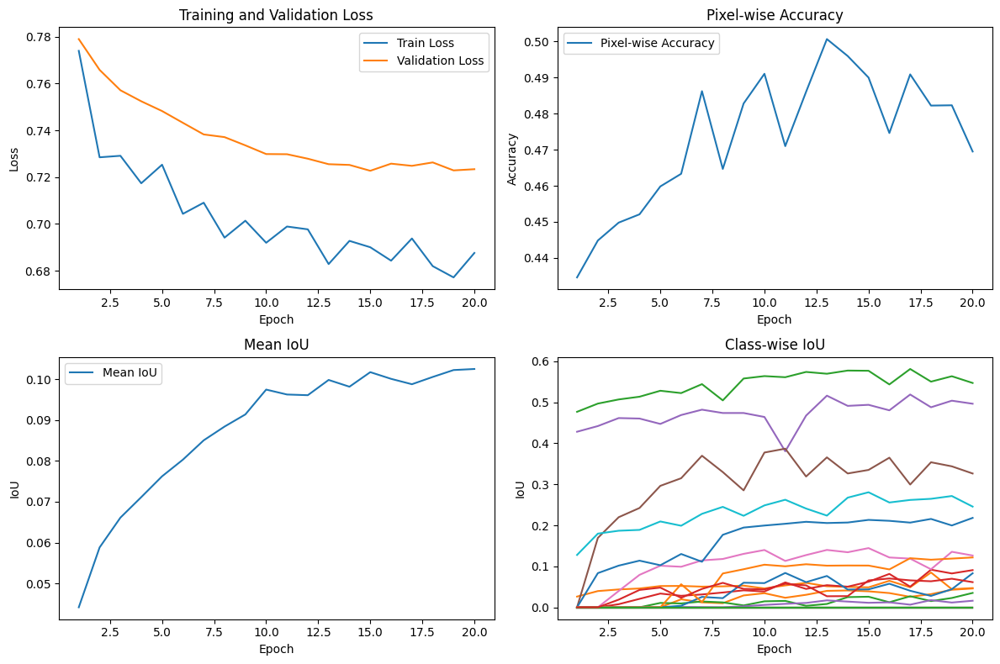

Saving SimpleFCN best model as 'SimpleFCN_best_model.pth'...
Testing SimpleFCN on test-set...
Test Loss: 0.48145467713475226
Pixel-wise Accuracy: 0.41575307846069337
Mean IoU: 0.10154193639755249
IoU for class 0: 0.0
IoU for class 1: 0.003772591007873416
IoU for class 2: 0.3945310413837433
IoU for class 3: 0.11018096655607224
IoU for class 4: 0.5793235301971436
IoU for class 5: 0.27703872323036194
IoU for class 6: 0.17672793567180634
IoU for class 7: 0.0
IoU for class 8: 0.0
IoU for class 9: 0.33057406544685364
IoU for class 10: 0.13892510533332825
IoU for class 11: 0.027593977749347687
IoU for class 12: 0.09019561856985092
IoU for class 13: 0.0
IoU for class 14: 0.024910401552915573
IoU for class 15: 0.0
IoU for class 16: 0.0
IoU for class 17: 0.0
IoU for class 18: 0.0
IoU for class 19: 0.0
IoU for class 20: 0.06451339274644852
IoU for class 21: 0.11007663607597351
IoU for class 22: 0.0
IoU for class 23: 0.1086425855755806
Simple FCN model trained, tested, and evaluated.


In [22]:
# Clear cache and collect garbage
torch.cuda.empty_cache()
gc.collect()

# Dictionary to store the results
model_results = {}

# Training loop for each model
for model_name, model in models.items():
    print(f"Training {model_name}...")

    # If using DataParallel use all the available GPUs
    model = nn.DataParallel(model)
    model.to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))

    epochs = 50
    lr = 0.0001
    patience = 5

    trainer = Trainer(model, train_dataloader, val_dataloader, test_dataloader, lr=lr, patience=patience)
    trainer.train(epochs)

    # Save the best model
    print(f"Saving {model_name} best model as '{model_name}_best_model.pth'...")
    torch.save(trainer.best_model_state, f"{model_name}_best_model.pth")

    # Test the model
    print(f"Testing {model_name} on test-set...")
    test_loss, test_pixel_acc, test_mean_iou, class_iou = trainer.test()

    # Store the results
    model_results[model_name] = {
        'test_loss': test_loss,
        'test_pixel_acc': test_pixel_acc,
        'test_mean_iou': test_mean_iou,
        'class_iou': class_iou,
        'epochs': epochs,
        'lr': lr,
        'patience': patience,
    }

print("Simple FCN model trained, tested, and evaluated.")

## Evaluating Saved Models on Test Set
* This code loads pre-trained models, evaluates them on a test dataset, and visualizes the results by displaying the original image, true label, and predicted classes for a specified number of images. It also clears the GPU cache after evaluation to free up memory.

Evaluating SimpleFCN...


<ipython-input-23-4e3f07ea2862>:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(f"{model_name}_best_model.pth")


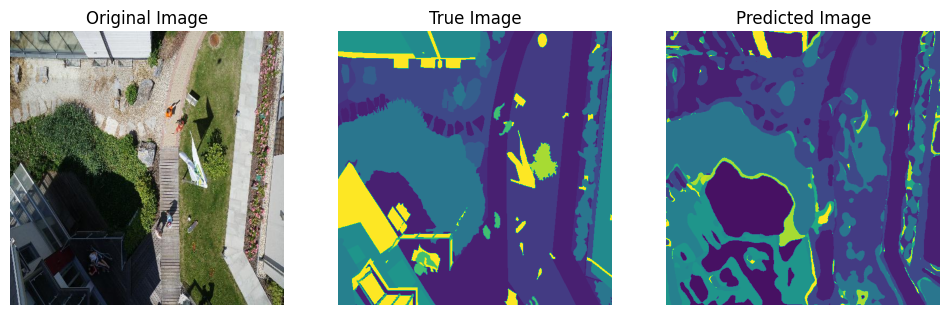

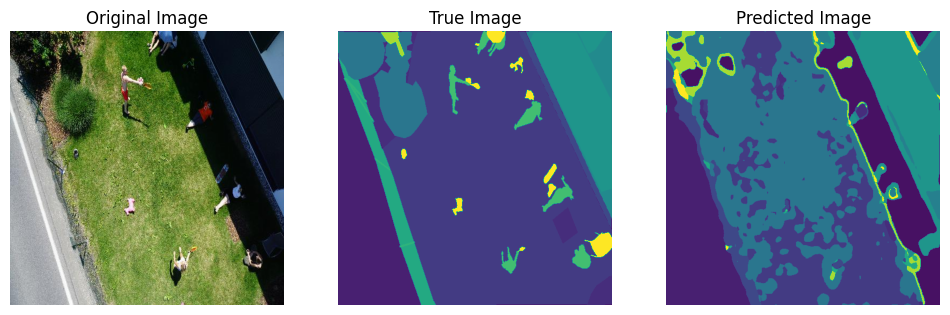

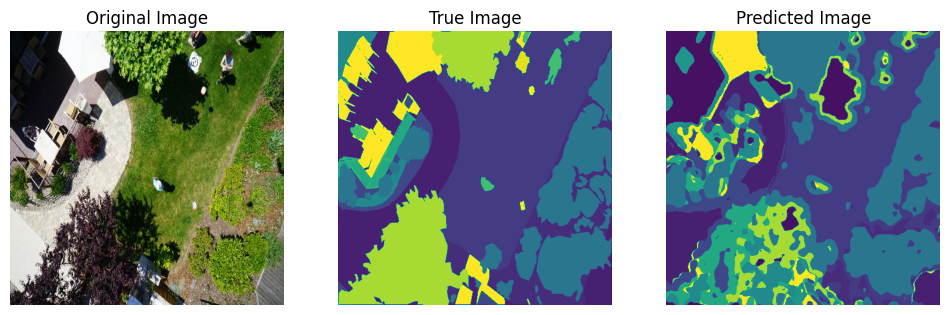

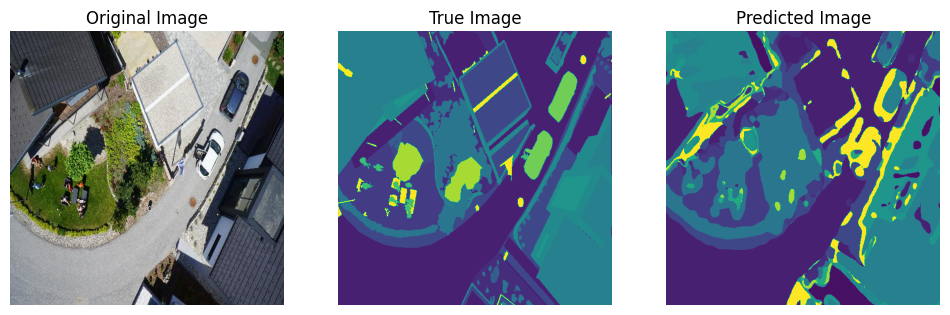

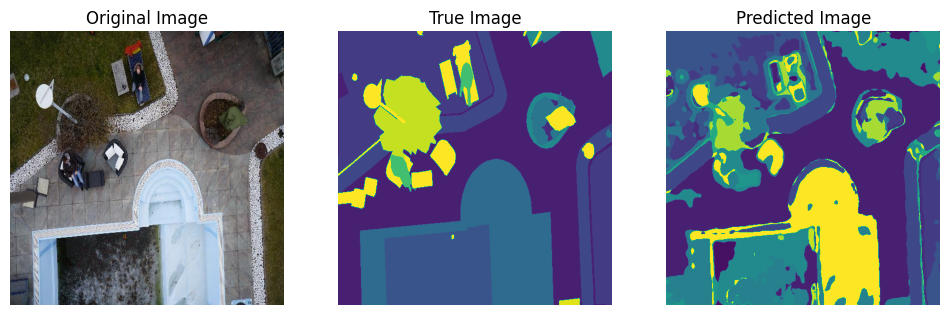

In [23]:
def evaluate_saved_models(models, test_dataloader, device, mean, std, num_images = 2):
    for model_name, model_class in models.items():
        print(f"Evaluating {model_name}...")

        # Initialize the model architecture
        model = model_class

        # Use all the available GPUs
        model = nn.DataParallel(model)
        model.to(device)

        # Load the saved model state
        checkpoint = torch.load(f"{model_name}_best_model.pth")
        model.load_state_dict(checkpoint)

        model.eval()
        with torch.no_grad():
            for i, (images, labels) in enumerate(test_dataloader):
                images = images.to(device)
                labels = labels.to(device).long().squeeze(1)

                outputs = model(images)
                probabilities = torch.nn.functional.softmax(outputs, dim=1)
                predicted_classes = torch.argmax(probabilities, dim=1)

                plt.figure(figsize=(12, 8))

                # Display original image
                plt.subplot(1, 3, 1)
                image_denormalized = denormalize_image(images[0].permute(1, 2, 0).cpu(), mean, std)
                plt.imshow(image_denormalized)
                plt.title('Original Image')
                plt.axis('off')

                # Display true label
                plt.subplot(1, 3, 2)
                plt.imshow(labels[0].cpu().numpy(), vmin=0, vmax=23)
                plt.title('True Image')
                plt.axis('off')

                # Display predicted classes
                plt.subplot(1, 3, 3)
                plt.imshow(predicted_classes[0].cpu().numpy(), vmin=0, vmax=23)
                plt.title('Predicted Image')
                plt.axis('off')

                plt.show()

                if i == num_images - 1:
                    break

        # Clear cache and collect garbage
        torch.cuda.empty_cache()
        gc.collect()

evaluate_saved_models(models, test_dataloader, device, mean, std, num_images = 5)

# 6. U-NET Model Training
##  Loading and Preprocessing Drone Dataset for Semantic Segmentation
* This code prepares the environment for training a semantic segmentation model by importing necessary libraries, setting up device configurations, and defining dataset paths. It creates a DataFrame with image file names and prints the total number of images in the dataset.

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

from PIL import Image
import cv2
import albumentations as A

import time
import os
from tqdm.notebook import tqdm

!pip install -q segmentation-models-pytorch
!pip install -q torchsummary

from torchsummary import summary
import segmentation_models_pytorch as smp

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMAGE_PATH = '../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/'
MASK_PATH = '../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/'
n_classes = 23

def create_df():
    name = []
    for dirname, _, filenames in os.walk(IMAGE_PATH):
        for filename in filenames:
            name.append(filename.split('.')[0])

    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df = create_df()
print('Total Images: ', len(df))

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Total Images:  400


## Splitting the Dataset into Training, Validation, and Test Sets
* The code splits the dataset into training (76.5%), validation (13.5%), and test (10%) sets and prints their sizes.

In [25]:
#split data
X_trainval, X_test = train_test_split(df['id'].values, test_size=0.1, random_state=19)
X_train, X_val = train_test_split(X_trainval, test_size=0.15, random_state=19)

print('Train Size   : ', len(X_train))
print('Val Size     : ', len(X_val))
print('Test Size    : ', len(X_test))

Train Size   :  306
Val Size     :  54
Test Size    :  40


##  DroneDataset Class for Semantic Segmentation
* The DroneDataset class is a custom dataset for semantic segmentation, which loads images and masks, applies transformations, normalizes them, and optionally splits images into patches for more efficient training.

In [26]:
class DroneDataset(Dataset):

    def __init__(self, img_path, mask_path, X, mean, std, transform=None, patch=False):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.transform = transform
        self.patches = patch
        self.mean = mean
        self.std = std

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.jpg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.X[idx] + '.png', cv2.IMREAD_GRAYSCALE)

        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']

        if self.transform is None:
            img = Image.fromarray(img)

        t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        img = t(img)
        mask = torch.from_numpy(mask).long()

        if self.patches:
            img, mask = self.tiles(img, mask)

        return img, mask

    def tiles(self, img, mask):

        img_patches = img.unfold(1, 512, 512).unfold(2, 768, 768)
        img_patches  = img_patches.contiguous().view(3,-1, 512, 768)
        img_patches = img_patches.permute(1,0,2,3)

        mask_patches = mask.unfold(0, 512, 512).unfold(1, 768, 768)
        mask_patches = mask_patches.contiguous().view(-1, 512, 768)

        return img_patches, mask_patches

##  Dataset and DataLoader Setup for Semantic Segmentation
* This code configures data augmentation for the training and validation datasets and sets up DataLoader objects for loading images and masks for semantic segmentation. The training set includes augmentation techniques like flipping, grid distortion, and noise, while the validation set only uses resizing and flipping.

In [27]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

t_train = A.Compose([A.Resize(704, 1056, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(), A.VerticalFlip(),
                     A.GridDistortion(p=0.2), A.RandomBrightnessContrast((0,0.5),(0,0.5)),
                     A.GaussNoise()])

t_val = A.Compose([A.Resize(704, 1056, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(),
                   A.GridDistortion(p=0.2)])

#datasets
train_set = DroneDataset(IMAGE_PATH, MASK_PATH, X_train, mean, std, t_train, patch=False)
val_set = DroneDataset(IMAGE_PATH, MASK_PATH, X_val, mean, std, t_val, patch=False)

#dataloader
batch_size= 3

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=True)

## Initializing a U-Net Model with MobileNetV2 Encoder for Semantic Segmentation 
* This code initializes a U-Net model for semantic segmentation using a MobileNetV2 encoder pre-trained on ImageNet, designed to predict 23 classes with a custom decoder architecture. It leverages transfer learning for improved performance

In [28]:
model = smp.Unet('mobilenet_v2', encoder_weights='imagenet', classes=23, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])
model

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 111MB/s] 


Unet(
  (encoder): MobileNetV2Encoder(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_size=(1

##   Training Loop with Evaluation and Early Stopping for U-Net Model
* This code implements a training loop for a U-Net model in semantic segmentation, calculating pixel accuracy and mean IoU. It includes a dynamic learning rate scheduler, model saving based on performance, early stopping, and image patching for efficient training.

In [29]:
def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy

def mIoU(pred_mask, mask, smooth=1e-10, n_classes=23):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union +smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)
        
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def fit(epochs, model, train_loader, val_loader, criterion, optimizer, scheduler, patch=False):
    torch.cuda.empty_cache()
    train_losses = []
    test_losses = []
    val_iou = []; val_acc = []
    train_iou = []; train_acc = []
    lrs = []
    min_loss = np.inf
    decrease = 1 ; not_improve=0

    model.to(device)
    fit_time = time.time()
    for e in range(epochs):
        since = time.time()
        running_loss = 0
        iou_score = 0
        accuracy = 0
        #training loop
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            #training phase
            image_tiles, mask_tiles = data
            if patch:
                bs, n_tiles, c, h, w = image_tiles.size()

                image_tiles = image_tiles.view(-1,c, h, w)
                mask_tiles = mask_tiles.view(-1, h, w)

            image = image_tiles.to(device); mask = mask_tiles.to(device);
            #forward
            output = model(image)
            loss = criterion(output, mask)
            #evaluation metrics
            iou_score += mIoU(output, mask)
            accuracy += pixel_accuracy(output, mask)
            #backward
            loss.backward()
            optimizer.step() #update weight
            optimizer.zero_grad() #reset gradient

            #step the learning rate
            lrs.append(get_lr(optimizer))
            scheduler.step()

            running_loss += loss.item()

        else:
            model.eval()
            test_loss = 0
            test_accuracy = 0
            val_iou_score = 0
            #validation loop
            with torch.no_grad():
                for i, data in enumerate(tqdm(val_loader)):
                    #reshape to 9 patches from single image, delete batch size
                    image_tiles, mask_tiles = data

                    if patch:
                        bs, n_tiles, c, h, w = image_tiles.size()

                        image_tiles = image_tiles.view(-1,c, h, w)
                        mask_tiles = mask_tiles.view(-1, h, w)

                    image = image_tiles.to(device); mask = mask_tiles.to(device);
                    output = model(image)
                    #evaluation metrics
                    val_iou_score +=  mIoU(output, mask)
                    test_accuracy += pixel_accuracy(output, mask)
                    #loss
                    loss = criterion(output, mask)
                    test_loss += loss.item()

            #calculatio mean for each batch
            train_losses.append(running_loss/len(train_loader))
            test_losses.append(test_loss/len(val_loader))


            if min_loss > (test_loss/len(val_loader)):
                print('Loss Decreasing.. {:.3f} >> {:.3f} '.format(min_loss, (test_loss/len(val_loader))))
                min_loss = (test_loss/len(val_loader))
                decrease += 1
                if decrease % 5 == 0:
                    print('saving model...')
                    torch.save(model, 'Unet-Mobilenet_v2_mIoU-{:.3f}.pt'.format(val_iou_score/len(val_loader)))


            if (test_loss/len(val_loader)) > min_loss:
                not_improve += 1
                min_loss = (test_loss/len(val_loader))
                print(f'Loss Not Decrease for {not_improve} time')
                if not_improve == 7:
                    print('Loss not decrease for 7 times, Stop Training')
                    break

            #iou
            val_iou.append(val_iou_score/len(val_loader))
            train_iou.append(iou_score/len(train_loader))
            train_acc.append(accuracy/len(train_loader))
            val_acc.append(test_accuracy/ len(val_loader))
            print("Epoch:{}/{}..".format(e+1, epochs),
                  "Train Loss: {:.3f}..".format(running_loss/len(train_loader)),
                  "Val Loss: {:.3f}..".format(test_loss/len(val_loader)),
                  "Train mIoU:{:.3f}..".format(iou_score/len(train_loader)),
                  "Val mIoU: {:.3f}..".format(val_iou_score/len(val_loader)),
                  "Train Acc:{:.3f}..".format(accuracy/len(train_loader)),
                  "Val Acc:{:.3f}..".format(test_accuracy/len(val_loader)),
                  "Time: {:.2f}m".format((time.time()-since)/60))

    history = {'train_loss' : train_losses, 'val_loss': test_losses,
               'train_miou' :train_iou, 'val_miou':val_iou,
               'train_acc' :train_acc, 'val_acc':val_acc,
               'lrs': lrs}
    print('Total time: {:.2f} m' .format((time.time()- fit_time)/60))
    return history

## Training U-Net Model with OneCycleLR Scheduler
* This code trains the U-Net model for 15 epochs using the AdamW optimizer with weight decay and a OneCycleLR scheduler. It uses CrossEntropyLoss and tracks metrics like loss, accuracy, and mIoU during training.

In [30]:
max_lr = 1e-3
epoch = 15
weight_decay = 1e-4

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history = fit(epoch, model, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. inf >> 1.915 
Epoch:1/15.. Train Loss: 2.799.. Val Loss: 1.915.. Train mIoU:0.046.. Val mIoU: 0.129.. Train Acc:0.211.. Val Acc:0.587.. Time: 3.44m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 1.915 >> 1.204 
Epoch:2/15.. Train Loss: 1.784.. Val Loss: 1.204.. Train mIoU:0.124.. Val mIoU: 0.162.. Train Acc:0.591.. Val Acc:0.708.. Time: 3.49m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 1.204 >> 1.017 
Epoch:3/15.. Train Loss: 1.435.. Val Loss: 1.017.. Train mIoU:0.129.. Val mIoU: 0.177.. Train Acc:0.610.. Val Acc:0.726.. Time: 3.43m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Not Decrease for 1 time
Epoch:4/15.. Train Loss: 1.353.. Val Loss: 1.032.. Train mIoU:0.141.. Val mIoU: 0.185.. Train Acc:0.606.. Val Acc:0.702.. Time: 3.44m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 1.032 >> 0.973 
saving model...
Epoch:5/15.. Train Loss: 1.167.. Val Loss: 0.973.. Train mIoU:0.179.. Val mIoU: 0.203.. Train Acc:0.664.. Val Acc:0.713.. Time: 3.47m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.973 >> 0.866 
Epoch:6/15.. Train Loss: 1.079.. Val Loss: 0.866.. Train mIoU:0.193.. Val mIoU: 0.212.. Train Acc:0.688.. Val Acc:0.736.. Time: 3.57m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.866 >> 0.805 
Epoch:7/15.. Train Loss: 1.001.. Val Loss: 0.805.. Train mIoU:0.213.. Val mIoU: 0.222.. Train Acc:0.703.. Val Acc:0.759.. Time: 3.44m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.805 >> 0.756 
Epoch:8/15.. Train Loss: 0.978.. Val Loss: 0.756.. Train mIoU:0.220.. Val mIoU: 0.251.. Train Acc:0.709.. Val Acc:0.780.. Time: 3.44m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.756 >> 0.671 
Epoch:9/15.. Train Loss: 0.865.. Val Loss: 0.671.. Train mIoU:0.246.. Val mIoU: 0.271.. Train Acc:0.746.. Val Acc:0.796.. Time: 3.48m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Not Decrease for 2 time
Epoch:10/15.. Train Loss: 0.811.. Val Loss: 0.679.. Train mIoU:0.260.. Val mIoU: 0.272.. Train Acc:0.765.. Val Acc:0.791.. Time: 3.45m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.679 >> 0.670 
saving model...
Epoch:11/15.. Train Loss: 0.742.. Val Loss: 0.670.. Train mIoU:0.284.. Val mIoU: 0.288.. Train Acc:0.785.. Val Acc:0.795.. Time: 3.44m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.670 >> 0.599 
Epoch:12/15.. Train Loss: 0.673.. Val Loss: 0.599.. Train mIoU:0.298.. Val mIoU: 0.307.. Train Acc:0.804.. Val Acc:0.815.. Time: 3.44m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.599 >> 0.577 
Epoch:13/15.. Train Loss: 0.633.. Val Loss: 0.577.. Train mIoU:0.309.. Val mIoU: 0.312.. Train Acc:0.814.. Val Acc:0.825.. Time: 3.47m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.577 >> 0.576 
Epoch:14/15.. Train Loss: 0.635.. Val Loss: 0.576.. Train mIoU:0.317.. Val mIoU: 0.322.. Train Acc:0.813.. Val Acc:0.826.. Time: 3.46m


  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

Loss Decreasing.. 0.576 >> 0.569 
Epoch:15/15.. Train Loss: 0.606.. Val Loss: 0.569.. Train mIoU:0.324.. Val mIoU: 0.328.. Train Acc:0.824.. Val Acc:0.830.. Time: 3.44m
Total time: 51.91 m


##  Save the Trained U-Net Model
* This code saves the trained U-Net model with MobileNetV2 as its encoder to a file named Unet-Mobilenet.pt. Saving the model allows for future loading and use, without needing to retrain it.

In [31]:
torch.save(model, 'Unet-Mobilenet.pt')

## Plot Training and Validation Metrics
* This code visualizes the model's performance by plotting training and validation loss, mean IoU, and accuracy per epoch.

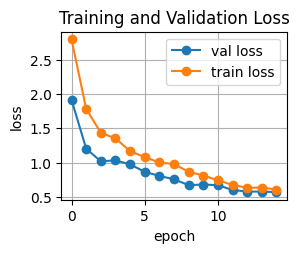

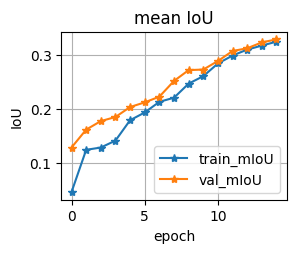

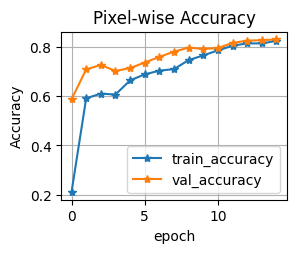

In [32]:
def plot_loss(history):
    plt.subplot(2, 2, 1)
    plt.plot(history['val_loss'], label='val loss', marker='o')
    plt.plot( history['train_loss'], label='train loss', marker='o')
    plt.title('Training and Validation Loss'); plt.ylabel('loss');
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.show()

def plot_score(history):
    plt.subplot(2, 2, 2)
    plt.plot(history['train_miou'], label='train_mIoU', marker='*')
    plt.plot(history['val_miou'], label='val_mIoU',  marker='*')
    plt.title('mean IoU'); plt.ylabel('IoU')
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.show()

def plot_acc(history):
    plt.subplot(2, 2, 3)
    plt.plot(history['train_acc'], label='train_accuracy', marker='*')
    plt.plot(history['val_acc'], label='val_accuracy',  marker='*')
    plt.title('Pixel-wise Accuracy'); plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.show()
plot_loss(history)
plot_score(history)
plot_acc(history)

## DroneTestDataset Class for Semantic Segmentation Testing
* The DroneTestDataset class loads and processes test images and their corresponding masks, applying a resizing transformation. It returns the processed images and masks as tensors for evaluation in a semantic segmentation model.

In [33]:
class DroneTestDataset(Dataset):

    def __init__(self, img_path, mask_path, X, transform=None):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.jpg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.X[idx] + '.png', cv2.IMREAD_GRAYSCALE)

        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']

        if self.transform is None:
            img = Image.fromarray(img)

        mask = torch.from_numpy(mask).long()

        return img, mask


t_test = A.Resize(768, 1152, interpolation=cv2.INTER_NEAREST)
test_set = DroneTestDataset(IMAGE_PATH, MASK_PATH, X_test, transform=t_test)

##  Model Prediction and Evaluation for Semantic Segmentation
* The code predicts the mask for a given image using a trained model and computes evaluation metrics (mean IoU and pixel accuracy). It applies necessary transformations to the image and mask before returning the predicted mask and corresponding score.

In [34]:
def predict_image_mask_miou(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        score = mIoU(output, mask)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, score
    
def predict_image_mask_pixel(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        acc = pixel_accuracy(output, mask)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, acc
image, mask = test_set[3]
pred_mask, score = predict_image_mask_miou(model, image, mask)

##  Evaluate Model Performance on Test Set
* This code calculates the mIoU and pixel accuracy for each image in the test set, storing the results in mob_miou and mob_acc. The functions miou_score and pixel_acc loop through the test set, using the model to generate predictions and compute the respective scores.

In [35]:
def miou_score(model, test_set):
    score_iou = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, score = predict_image_mask_miou(model, img, mask)
        score_iou.append(score)
    return score_iou
mob_miou = miou_score(model, test_set)

def pixel_acc(model, test_set):
    accuracy = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, acc = predict_image_mask_pixel(model, img, mask)
        accuracy.append(acc)
    return accuracy
mob_acc = pixel_acc(model, test_set)

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

## Model Predictions with mIoU
* This code visualizes the original image, true mask, and the predicted mask for selected test indices. It plots the images alongside the model's prediction and the corresponding mIoU score, providing a visual comparison of the model's performance.

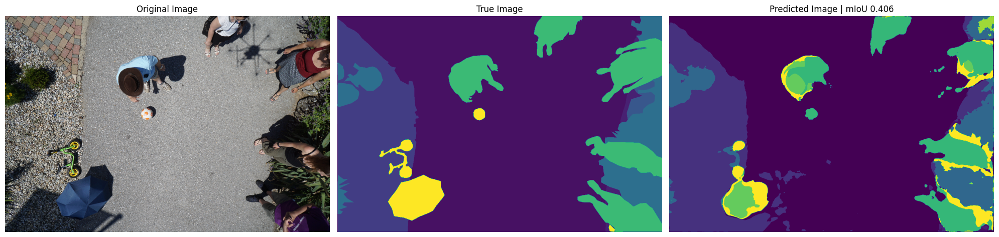

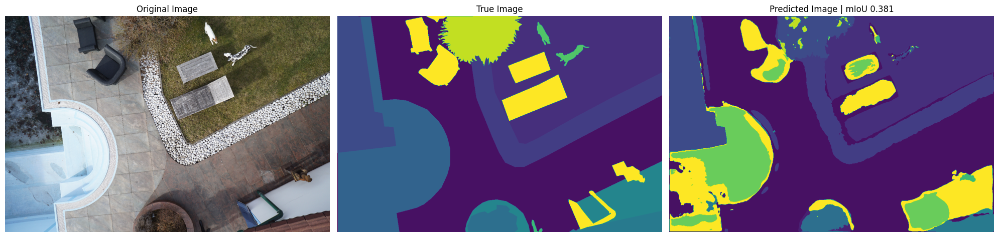

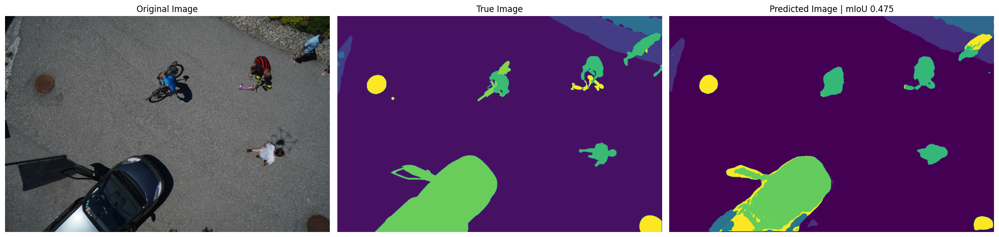

In [36]:
# Define test indices to visualize
test_indices = [3, 4, 6]  # Change indices as needed

for idx in test_indices:
    image, mask = test_set[idx]
    pred_mask, score = predict_image_mask_miou(model, image, mask)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
    
    ax1.imshow(image)
    ax1.set_title('Original Image')
    ax1.set_axis_off()
    
    ax2.imshow(mask)
    ax2.set_title('True Image')
    ax2.set_axis_off()
    
    ax3.imshow(pred_mask)
    ax3.set_title(f'Predicted Image | mIoU {score:.3f}')
    ax3.set_axis_off()

    plt.tight_layout()
    plt.show()

##  Calculate and Print mIoU and Pixel Accuracy
* The code calculates and prints the average mIoU and pixel accuracy for the test set to evaluate model performance.

In [37]:
print(f"Testing U-Net on test-set...")
print('mean IoU', np.mean(mob_miou))
print('Pixel-wise Accuracy', np.mean(mob_acc))

Testing U-Net on test-set...
mean IoU 0.34134926382933106
Pixel-wise Accuracy 0.8000633239746093
